# Monthly mean correlations

In [1]:
## import required packages
import numpy as np
import pandas as pd
import sys
import xarray as xr
import matplotlib.pyplot as plt
import glob
import warnings
from pathlib import Path
import s3fs
import matplotlib
import gsw
import cmocean
import time
from scipy.stats import t
import calendar
import time
from scipy.stats import linregress

In [2]:
import warnings
warnings.filterwarnings("ignore", module='distributed')

In [3]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:45305")
client

<Client: 'tcp://127.0.0.1:45305' processes=8 threads=32, memory=123.95 GiB>

In [4]:
# initialize s3 filesystem
s3_options = dict(anon=False)

In [5]:
# function to open zarr store with a provided s3 bucket path
def open_zarr_store(s3_path, s3_options):
    # initalize s3 file system
    s3 = s3fs.S3FileSystem(**s3_options)

    # define location of zarr store and open
    store = s3fs.S3Map(root=s3_path, s3=s3, check=False)
    zarr_store = xr.open_zarr(store)
    
    return zarr_store

## Generate monthly mean datasets

In [166]:
# open SALT zarr store - [psu]
SALT_zarr = open_zarr_store('s3://ecco-processed-data/SASSIE/N1/HH/ZARR/SALT_AVG_DAILY.ZARR/', s3_options)

# open THETA zarr store - [degC]
THETA_zarr = open_zarr_store('s3://ecco-processed-data/SASSIE/N1/HH/ZARR/THETA_AVG_DAILY.ZARR/', s3_options)

# open SIarea zarr store - [fraction of sea ice, 0 to 1]
SI_zarr = open_zarr_store('s3://ecco-processed-data/SASSIE/N1/HH/ZARR/SIarea_AVG_DAILY.ZARR/', s3_options)

# open RHOAnoma zarr store
RHOAnoma_zarr = open_zarr_store('s3://ecco-processed-data/SASSIE/N1/HH/ZARR/RHOAnoma_AVG_DAILY.ZARR/', s3_options)

In [167]:
# take the monthly mean
salt_monthly = SALT_zarr.resample(time='1ME',label='left').mean()
theta_monthly = THETA_zarr.resample(time='1ME',label='left').mean()
seaice_monthly = SI_zarr.resample(time='1ME',label='left').mean()
density_monthly = RHOAnoma_zarr.resample(time='1ME',label='left').mean()

In [168]:
# make the timestamp in the middle of the month (15th)
salt_monthly["time"] = salt_monthly.indexes["time"] + pd.DateOffset(days=15)
theta_monthly["time"] = theta_monthly.indexes["time"] + pd.DateOffset(days=15)
seaice_monthly["time"] = seaice_monthly.indexes["time"] + pd.DateOffset(days=15)
density_monthly["time"] = density_monthly.indexes["time"] + pd.DateOffset(days=15)

In [9]:
# double check time
salt_monthly.time.values[0:20]

array(['2014-01-15T00:00:00.000000000', '2014-02-15T00:00:00.000000000',
       '2014-03-15T00:00:00.000000000', '2014-04-15T00:00:00.000000000',
       '2014-05-15T00:00:00.000000000', '2014-06-15T00:00:00.000000000',
       '2014-07-15T00:00:00.000000000', '2014-08-15T00:00:00.000000000',
       '2014-09-15T00:00:00.000000000', '2014-10-15T00:00:00.000000000',
       '2014-11-15T00:00:00.000000000', '2014-12-15T00:00:00.000000000',
       '2015-01-15T00:00:00.000000000', '2015-02-15T00:00:00.000000000',
       '2015-03-15T00:00:00.000000000', '2015-04-15T00:00:00.000000000',
       '2015-05-15T00:00:00.000000000', '2015-06-15T00:00:00.000000000',
       '2015-07-15T00:00:00.000000000', '2015-08-15T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [169]:
# double check time
density_monthly.time.values[0:20]

array(['2014-01-15T00:00:00.000000000', '2014-02-15T00:00:00.000000000',
       '2014-03-15T00:00:00.000000000', '2014-04-15T00:00:00.000000000',
       '2014-05-15T00:00:00.000000000', '2014-06-15T00:00:00.000000000',
       '2014-07-15T00:00:00.000000000', '2014-08-15T00:00:00.000000000',
       '2014-09-15T00:00:00.000000000', '2014-10-15T00:00:00.000000000',
       '2014-11-15T00:00:00.000000000', '2014-12-15T00:00:00.000000000',
       '2015-01-15T00:00:00.000000000', '2015-02-15T00:00:00.000000000',
       '2015-03-15T00:00:00.000000000', '2015-04-15T00:00:00.000000000',
       '2015-05-15T00:00:00.000000000', '2015-06-15T00:00:00.000000000',
       '2015-07-15T00:00:00.000000000', '2015-08-15T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [11]:
# save monthly mean ZARR datasets to scratch storage on nvme
salt_monthly.to_zarr('/nvme_data1/SALT_AVG_MONTHLY.ZARR')

In [12]:
theta_monthly.to_zarr('/nvme_data1/THETA_AVG_MONTHLY.ZARR/')

In [13]:
seaice_monthly.to_zarr('/nvme_data1/SIarea_AVG_MONTHLY.ZARR/')

In [ ]:
density_monthly.to_zarr('/nvme_data1/RHOAnoma_AVG_MONTHLY.ZARR/')

## Open monthly mean ZARR datasets

In [6]:
# open geometry file for HH field
HH_grid = xr.open_dataset("~/efs-mount-point/mzahn/sassie/HH/GRID/GRID_GEOMETRY_SASSIE_HH_V1R1_NATIVE_LLC1080.nc")

In [7]:
# open SALT zarr store - [psu]
SALT_zarr = open_zarr_store('s3://ecco-processed-data/SASSIE/N1/HH/ZARR/SALT_AVG_MONTHLY.ZARR/', s3_options)

# open THETA zarr store - [degC]
THETA_zarr = open_zarr_store('s3://ecco-processed-data/SASSIE/N1/HH/ZARR/THETA_AVG_MONTHLY.ZARR/', s3_options)

# open SIarea zarr store - [fraction of sea ice, 0 to 1]
SI_zarr = open_zarr_store('s3://ecco-processed-data/SASSIE/N1/HH/ZARR/SIarea_AVG_MONTHLY.ZARR/', s3_options)

# open RHOAnoma zarr store 
RHOAnoma_zarr = open_zarr_store('s3://ecco-processed-data/SASSIE/N1/HH/ZARR/RHOAnoma_AVG_MONTHLY.ZARR/', s3_options)

In [9]:
# remove 2021 to since we only have January and a few days in Feb that year
salt_month = SALT_zarr.SALT.sel(time=slice("2014","2020")).where(HH_grid.mask_basin==1)
theta_month = THETA_zarr.THETA.sel(time=slice("2014","2020")).where(HH_grid.mask_basin==1)
ice_month = SI_zarr.SIarea.sel(time=slice("2014","2020")).where(HH_grid.mask_basin.isel(k=0)==1)

# add reference density to density anomaly (RHOAnoma)
rhoConst = 1027.5 # reference density
density_month = RHOAnoma_zarr.RHOAnoma.sel(time=slice("2014","2020")).where(HH_grid.mask_basin==1) + rhoConst

## Calculate delta rho

In [10]:
print(density_month.isel(k=0).Z.values)
print(density_month.isel(k=10).Z.values)

-0.5
-21.125


In [11]:
# calculate delta sigma
delta_sigma_20m = density_month.isel(k=10) - density_month.isel(k=0)

In [12]:
print(density_month.isel(k=0).Z.values)
print(density_month.isel(k=21).Z.values)

-0.5
-99.37


In [13]:
# calculate delta sigma
delta_sigma_100m = density_month.isel(k=21) - density_month.isel(k=0)

## Plot annual climatology

In [26]:
# calculate weights to get annual averages since each month has a different number of days
days_in_month = ice_month.time.dt.days_in_month  # get days in each month
weights = days_in_month / days_in_month.sum()  # normalize to get weights

In [27]:
# Calculate weighted annual climatology
ice_climatology = (ice_month*100 * weights).sum(dim="time")
theta_climatology = (theta_month.isel(k=0) * weights).sum(dim="time")
salt_climatology = (salt_month.isel(k=0) * weights).sum(dim="time")

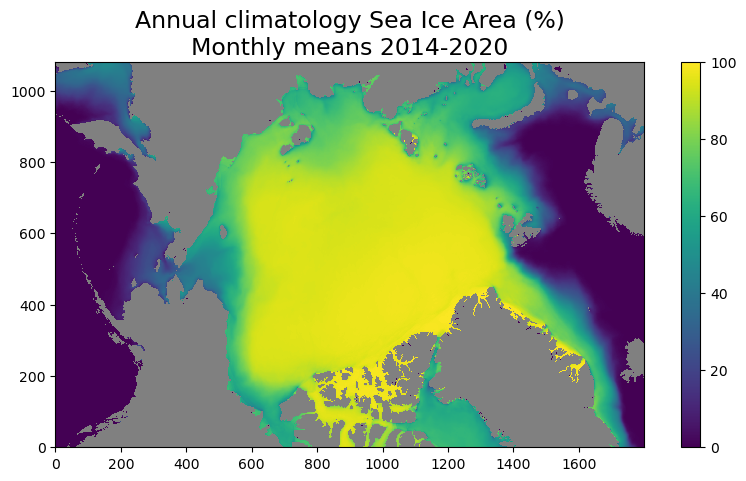

In [28]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
ice_climatology.where(HH_grid.hFacC.isel(k=0)>0).plot(ax=ax,cmap='viridis',vmin=0,vmax=100);
ax.set_facecolor('gray')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title('Annual climatology Sea Ice Area (%)\nMonthly means 2014-2020', size=17);

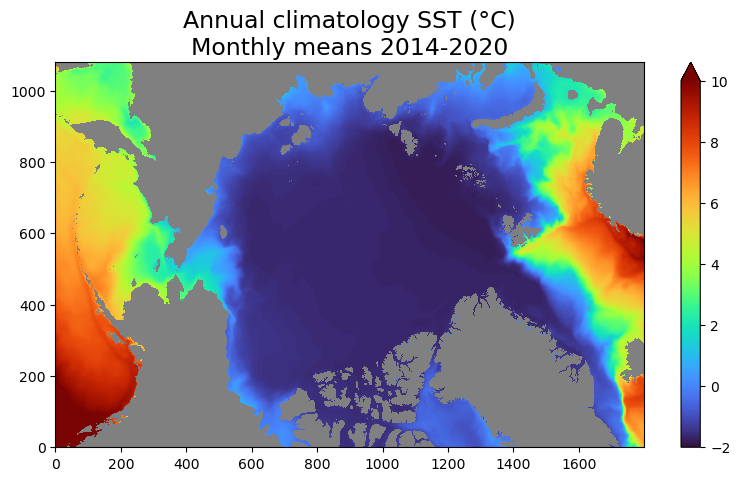

In [29]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
theta_climatology.where(HH_grid.hFacC.isel(k=0)>0).plot(ax=ax,cmap='turbo',vmin=-2,vmax=10);
ax.set_facecolor('gray')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title('Annual climatology SST (°C)\nMonthly means 2014-2020', size=17);

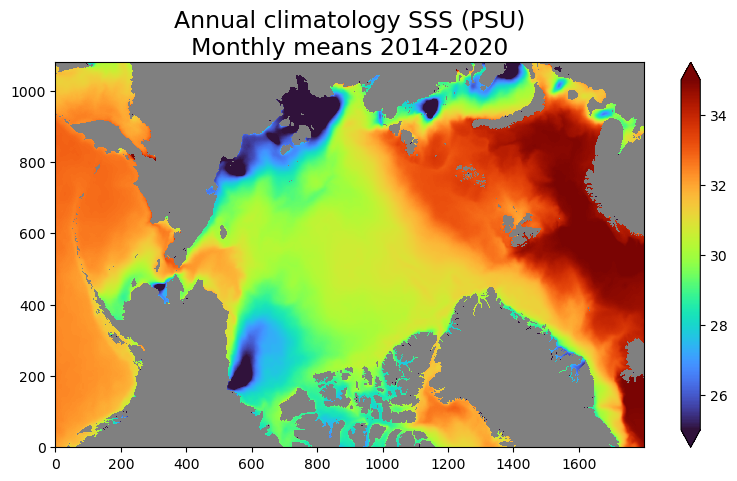

In [30]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
salt_climatology.where(HH_grid.hFacC.isel(k=0)>0).plot(ax=ax,cmap='turbo',vmin=25,vmax=35);
ax.set_facecolor('gray')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title('Annual climatology SSS (PSU)\nMonthly means 2014-2020', size=17);

## Plot monthly means across all 7 years

In [14]:
# group by month and calculate the mean over the 7-year period
ice_month_mean = (ice_month*100).groupby('time.month').mean(dim='time').compute()

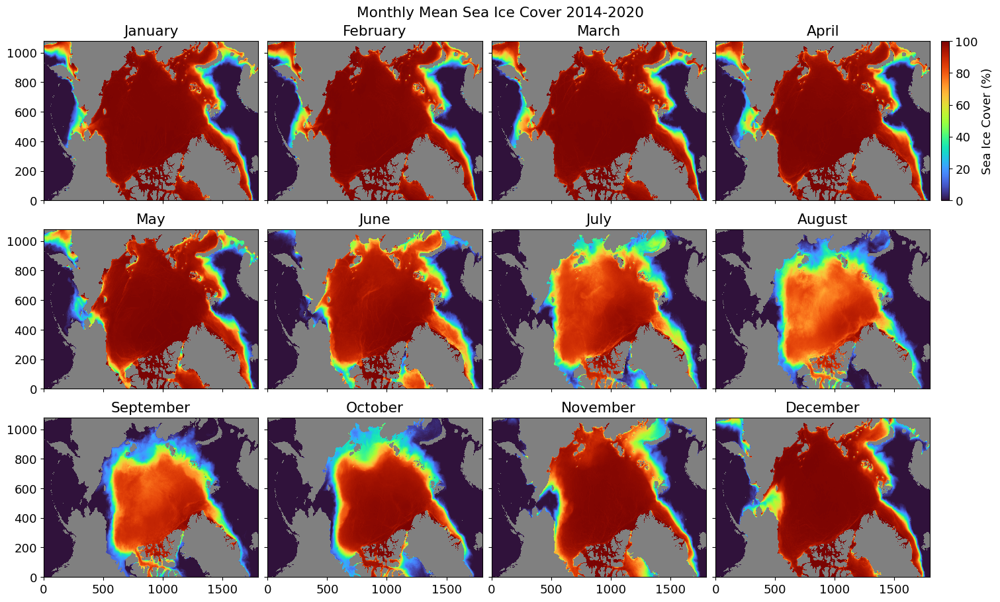

In [165]:
# get global vmin and vmax for consistent color mapping
vmin = 0
vmax = 100

# set up the figure and subplots
fig, axes = plt.subplots(3, 4, figsize=(15, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# plot each month's mean as a subplot
for month in range(1, 13):
    ax = axes[month - 1]
    im = ice_month_mean.sel(month=month).plot(
        ax=ax, 
        cmap='turbo', 
        vmin=vmin, 
        vmax=vmax, 
        add_colorbar=False
    )
    ax.set_title(calendar.month_name[month])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_facecolor('gray')

# add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes[3],  # the 4th subplot
    location='right'
)
cbar.ax.set_ylabel('Sea Ice Cover (%)')

# add a title
plt.suptitle('Monthly Mean Sea Ice Cover 2014-2020')
plt.show()

In [68]:
# group by month and calculate the mean over the 7-year period
salt_month_mean = salt_month.isel(k=0).groupby('time.month').mean(dim='time').compute()

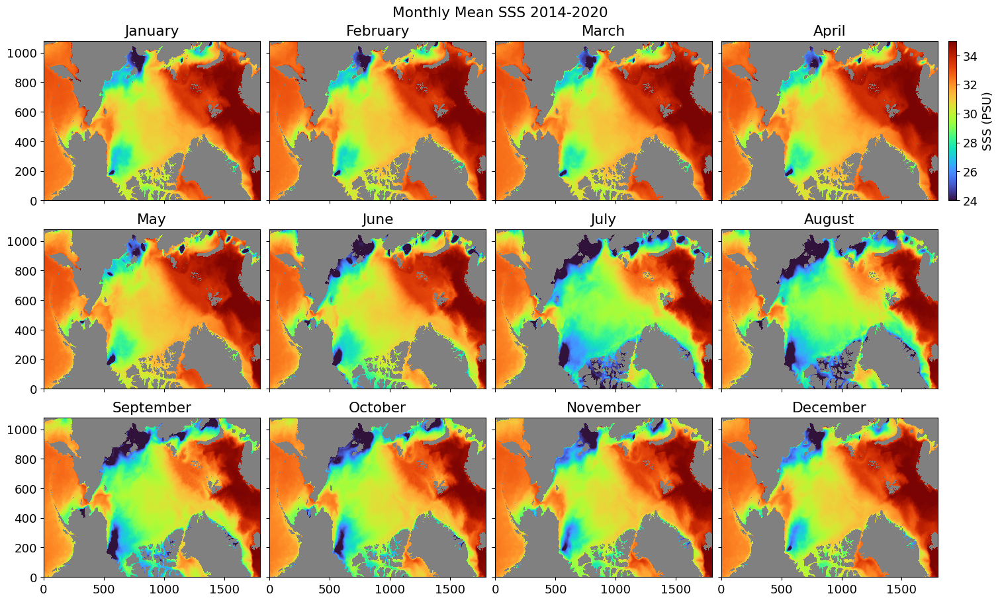

In [72]:
# get global vmin and vmax for consistent color mapping
vmin = 24
vmax = 35

# set up the figure and subplots
fig, axes = plt.subplots(3, 4, figsize=(15, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# plot each month's mean as a subplot
for month in range(1, 13):
    ax = axes[month - 1]
    im = salt_month_mean.sel(month=month).plot(
        ax=ax, 
        cmap='turbo', 
        vmin=vmin, 
        vmax=vmax, 
        add_colorbar=False
    )
    ax.set_title(calendar.month_name[month])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_facecolor('gray')

# add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes[3],  # the 4th subplot
    location='right'
)
cbar.ax.set_ylabel('SSS (PSU)')

# add a title
plt.suptitle('Monthly Mean SSS 2014-2020')
plt.show()

In [73]:
# group by month and calculate the mean over the 7-year period
theta_month_mean = theta_month.isel(k=0).groupby('time.month').mean(dim='time').compute()

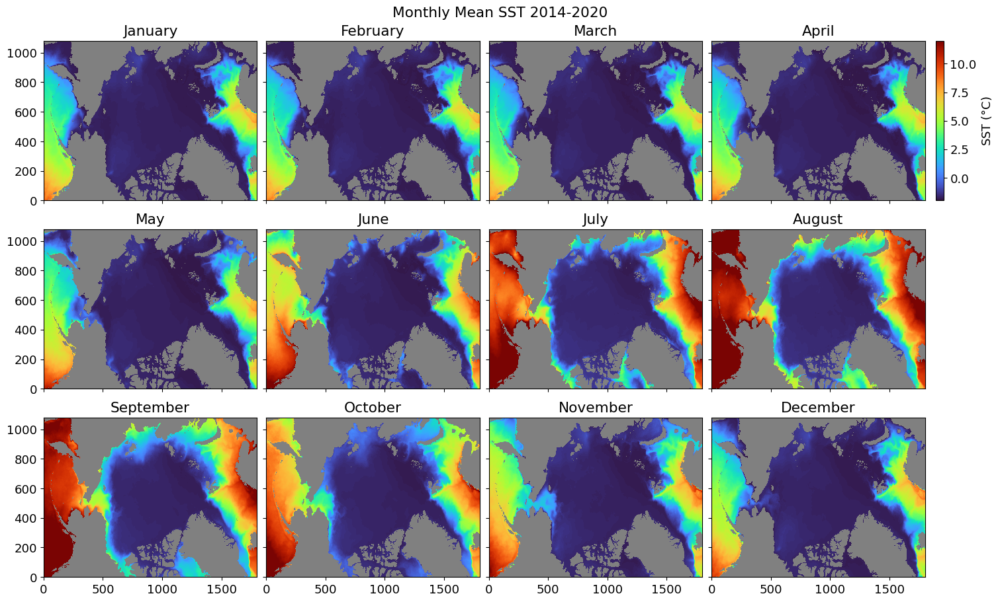

In [75]:
# get global vmin and vmax for consistent color mapping
vmin = -2
vmax = 12

# set up the figure and subplots
fig, axes = plt.subplots(3, 4, figsize=(15, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# plot each month's mean as a subplot
for month in range(1, 13):
    ax = axes[month - 1]
    im = theta_month_mean.sel(month=month).plot(
        ax=ax, 
        cmap='turbo', 
        vmin=vmin, 
        vmax=vmax, 
        add_colorbar=False
    )
    ax.set_title(calendar.month_name[month])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_facecolor('gray')

# add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes[3],  # the 4th subplot
    location='right'
)
cbar.ax.set_ylabel('SST ($\degree$C)')

# add a title
plt.suptitle('Monthly Mean SST 2014-2020')
plt.show()

In [16]:
# group by month and calculate the mean over the 7-year period
delta_sigma_20m_month_mean = delta_sigma_20m.groupby('time.month').mean(dim='time').compute()

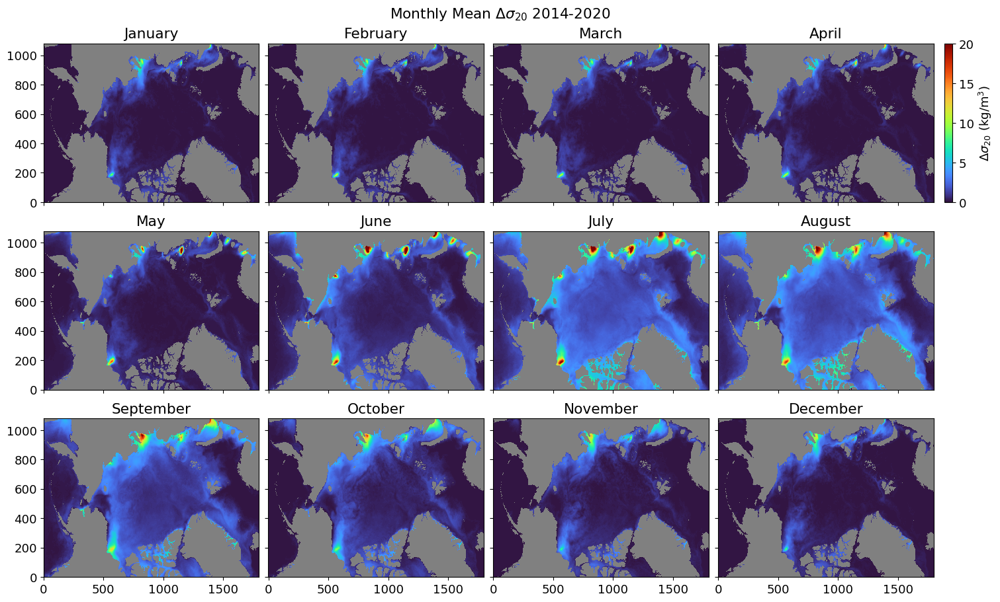

In [21]:
plt.rcParams["font.size"] = 13
# get global vmin and vmax for consistent color mapping
vmin = 0
vmax = 20

# set up the figure and subplots
fig, axes = plt.subplots(3, 4, figsize=(15, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# plot each month's mean as a subplot
for month in range(1, 13):
    ax = axes[month - 1]
    im = delta_sigma_20m_month_mean.sel(month=month).plot(
        ax=ax, 
        cmap='turbo', 
        vmin=vmin, 
        vmax=vmax, 
        add_colorbar=False
    )
    ax.set_title(calendar.month_name[month])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_facecolor('gray')

# add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes[3],  # the 4th subplot
    location='right'
)
cbar.ax.set_ylabel('$\Delta \sigma_{20}$ (kg/m$^3$)')

# add a title
plt.suptitle('Monthly Mean $\Delta \sigma_{20}$ 2014-2020')
plt.show()

In [18]:
# group by month and calculate the mean over the 7-year period
delta_sigma_100m_month_mean = delta_sigma_100m.groupby('time.month').mean(dim='time').compute()

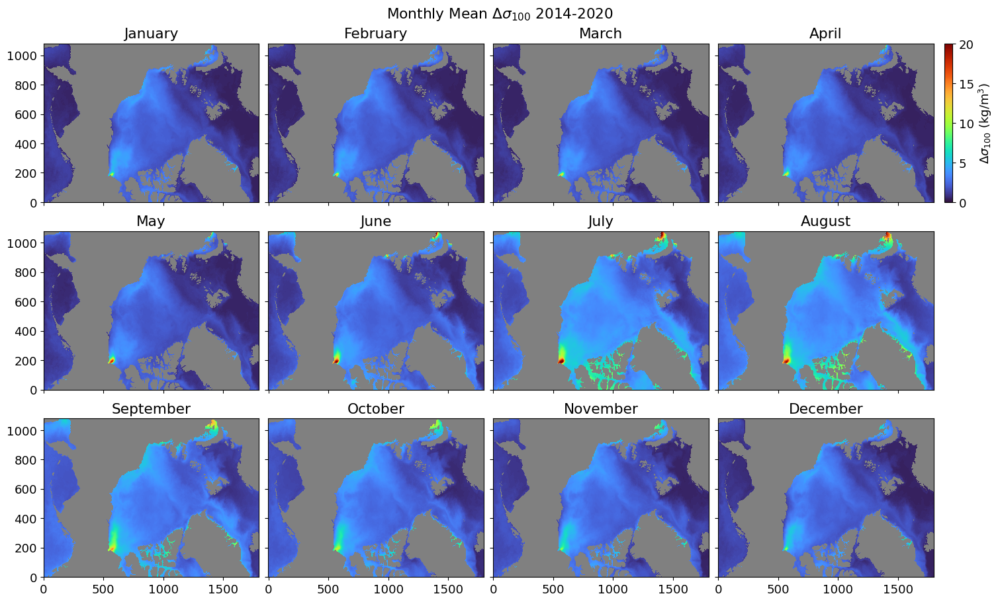

In [26]:
plt.rcParams["font.size"] = 13
# get global vmin and vmax for consistent color mapping
vmin = 0
vmax = 20

# set up the figure and subplots
fig, axes = plt.subplots(3, 4, figsize=(15, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# plot each month's mean as a subplot
for month in range(1, 13):
    ax = axes[month - 1]
    im = delta_sigma_100m_month_mean.sel(month=month).plot(
        ax=ax, 
        cmap='turbo', 
        vmin=vmin, 
        vmax=vmax, 
        add_colorbar=False
    )
    ax.set_title(calendar.month_name[month])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_facecolor('gray')

# add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes[3],  # the 4th subplot
    location='right'
)
cbar.ax.set_ylabel("$\Delta \sigma_{100}$ (kg/m$^3$)")

# add a title
plt.suptitle('Monthly Mean $\Delta \sigma_{100}$ 2014-2020')
plt.show()

## Compute temporal correlations

In [27]:
def sig_corr(corr_da, n):
    """
    Determine which correlations are statistically significant
    Mask insignificant values in provided array and return only signficant values

    n : sample size
    corr_da : correlation coefficients
    """
    
    # compute the t-statistic
    t_stat = corr_da * np.sqrt((n - 2) / (1 - corr_da**2))

    # compute p-values using the survival function (1 - CDF)
    p_values = 2 * t.sf(np.abs(t_stat), df=n - 2)

    # determine significance at alpha=0.05
    alpha = 0.05
    # mask non-significant correlations
    corr_significant = corr_da.where(p_values < alpha)
    
    return corr_significant

In [28]:
HH_grid_land = HH_grid.maskC.isel(k=0).where(HH_grid.maskC.isel(k=0)==0)

### Correlation between SSS and $\Delta \sigma_{\theta} =  \sigma_{\theta, 20 \, \text{m}} - \sigma_{\theta, \text{surface}}$

In [29]:
corr_20minus0 = xr.corr(salt_month.isel(k=0), delta_sigma_20m, dim='time').compute()

In [31]:
significant_corr_20minus0 = sig_corr(corr_20minus0, len(salt_month['time']))

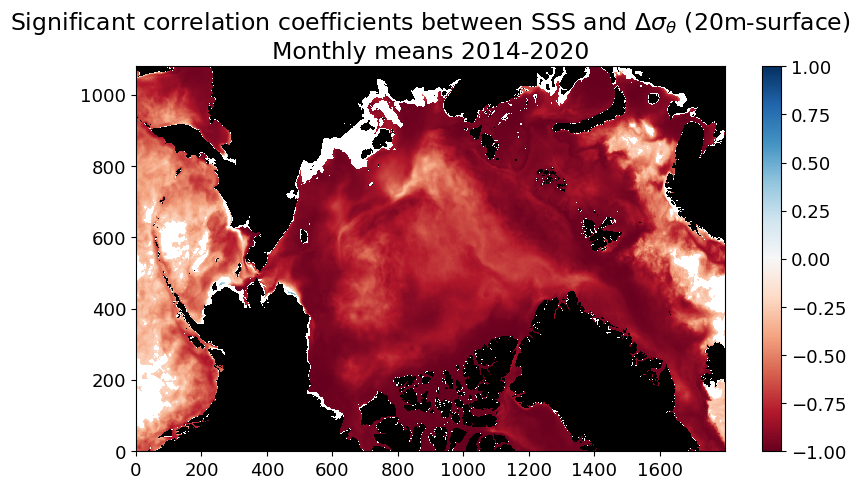

In [32]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
significant_corr_20minus0.plot(ax=ax,cmap='RdBu',vmin=-1,vmax=1);
# ax.set_facecolor('gray')
HH_grid_land.plot(vmin=0,vmax=1,cmap='Greys_r',add_colorbar=False);
ax.set_xlabel("")
ax.set_ylabel("")
# ax.set_title('Correlation coefficients between\nSSS and ' + r'$\Delta \sigma_{\theta}$ (20m-surface)' + '\nMonthly means 2014-2020', size=17);
ax.set_title(r'Significant correlation coefficients between SSS and $\Delta \sigma_{\theta}$ (20m-surface)' + '\nMonthly means 2014-2020', size=17);

### Correlation between SSS and $\Delta \sigma_{\theta} =  \sigma_{\theta, 100 \, \text{m}} - \sigma_{\theta, \text{surface}}$

In [33]:
corr_100minus0 = xr.corr(salt_month.isel(k=0), delta_sigma_100m, dim='time').compute()

In [34]:
significant_corr_100minus0 = sig_corr(corr_100minus0, len(salt_month['time']))

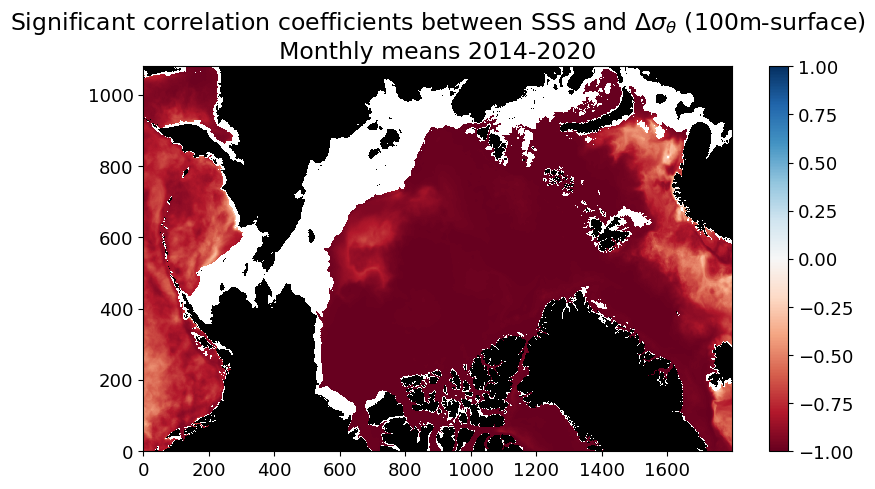

In [35]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
significant_corr_100minus0.plot(ax=ax,cmap='RdBu',vmin=-1,vmax=1);
# ax.set_facecolor('gray')
HH_grid_land.plot(vmin=0,vmax=1,cmap='Greys_r',add_colorbar=False);
ax.set_xlabel("")
ax.set_ylabel("")
# ax.set_title('Correlation coefficients between\nSSS and ' + r'$\Delta \sigma_{\theta}$ (100m-surface)' + '\nMonthly means 2014-2020', size=17);
ax.set_title(r'Significant correlation coefficients between SSS and $\Delta \sigma_{\theta}$ (100m-surface)' + '\nMonthly means 2014-2020', size=17);

### Correlation between SSS and integral of $N$ in upper 100 m

#### Calculate buoyancy frequency and save new Zarr store with results

Conversion functions: https://teos-10.github.io/GSW-Python/conversions.html

In [39]:
# pull out the upper 100 m of data
salt_month_upper100 = salt_month.isel(k=slice(0,22))
temp_month_upper100 = theta_month.isel(k=slice(0,22))

In [40]:
# pressure from depth
# Z needs to be positive up
pressure_da = gsw.p_from_z(HH_grid.isel(k=slice(0,22)).Z, HH_grid.YC).compute()

In [41]:
# just double check to make sure they look reasonable
pressure_da.isel(i=10,j=10).values

array([  0.50428623,   1.58346296,   2.8139329 ,   4.22091377,
         5.82962441,   7.66024071,   9.74302836,  12.1132969 ,
        14.80635815,  17.85752767,  21.30716931,  25.20573703,
        29.59864862,  34.53637577,  40.06938752,  46.25322558,
        53.14847207,  60.80564481,  69.28536079,  78.64826011,
        88.94996626, 100.246103  ])

In [42]:
# check shape of each dataset
print(np.shape(salt_month_upper100))
print(np.shape(temp_month_upper100))
print(np.shape(pressure_da))

(84, 22, 1080, 1800)
(84, 22, 1080, 1800)
(22, 1080, 1800)


#### initialize zarr store

In [89]:
time_chunk = 0

In [90]:
# start time
start_time = time.time()

N2, p_mid = gsw.Nsquared(salt_month_upper100.isel(time=time_chunk), temp_month_upper100.isel(time=time_chunk), pressure_da, axis=0)
# take average across whole domain
p_mid_avg = p_mid.mean(axis=(1,2))
N2_expand = np.expand_dims(N2, axis=0)
N2_da = xr.DataArray(data=N2_expand,dims=['time','p_mid','j','i'],\
                 coords=dict(time=[salt_month_upper100.isel(time=time_chunk).time.values],\
                             p_mid=p_mid_avg,j=salt_month_upper100.isel(time=time_chunk).j.values,\
                             i=salt_month_upper100.isel(time=time_chunk).i.values))

# end time
end_time = time.time()

# calculate elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.6f} seconds")

Execution time: 6.353911 seconds


In [91]:
N2_da.name = "N2"

In [92]:
# initialize Zarr store with first time step
N2_da.to_zarr('/home/jpluser/efs-mount-point/mzahn/sassie/HH/ZARR/N2_AVG_MONTHLY.ZARR', mode="w")

In [93]:
# Define the processing function
def process_N2_chunk(salt_month_upper100_1ME, temp_month_upper100_1ME):
    
    # Brunt Vaisala Frequency (N^2)
    # Buoyancy frequency-squared at pressure midpoints, 1/s^2. 
    # The shape along the pressure axis dimension is one less than that of the inputs. (Frequency N is in radians per second.)
    # Pressure at midpoints of p, dbar. The array shape matches N2.
    # N2, p_mid = gsw.Nsquared(salt_month, temp_month, pressure_da_expanded, axis=1)
    N2, p_mid = gsw.Nsquared(salt_month_upper100_1ME, temp_month_upper100_1ME, pressure_da, axis=0)

    # take average across whole domain
    p_mid_avg = p_mid.mean(axis=(1,2))
    N2_expand = np.expand_dims(N2, axis=0)
    N2_da = xr.DataArray(data=N2_expand,dims=['time','p_mid','j','i'],\
                     coords=dict(time=[salt_month_upper100_1ME.time.values],\
                                 p_mid=p_mid_avg,j=salt_month_upper100_1ME.j.values,\
                                 i=salt_month_upper100_1ME.i.values))
    N2_da.name = "N2"
    return N2_da

In [94]:
# start time
start_time = time.time()

# Loop through chunks and save results
for time_chunk in range(1,len(salt_month_upper100.time)):
    result = process_N2_chunk(salt_month_upper100.isel(time=time_chunk), \
                              temp_month_upper100.isel(time=time_chunk))
    result.to_zarr('/home/jpluser/efs-mount-point/mzahn/sassie/HH/ZARR/N2_AVG_MONTHLY.ZARR', append_dim="time")

# end time
end_time = time.time()

# calculate elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.6f} seconds")

Execution time: 1239.073683 seconds


### Open zarr store

In [45]:
N2_zarr = xr.open_zarr("/home/jpluser/efs-mount-point/mzahn/sassie/HH/ZARR/N2_AVG_MONTHLY.ZARR")

In [46]:
# select N2 for upper 20 and 100 m
N2_da_20m = N2_zarr.N2.sel(p_mid=slice(0,20))
N2_da_100m = N2_zarr.N2

In [47]:
# take integral of N over upper 20 m
N_int20 = np.sqrt(N2_da_20m.integrate('p_mid'))

In [48]:
# take integral of N over upper 100 m
N_int100 = np.sqrt(N2_da_100m.integrate('p_mid'))

Plot integral of N in upper 20 m for each month over 7 year period

In [78]:
# group by month and calculate the mean over the 7-year period
N2_da_20m_month_mean = N2_da_20m.groupby('time.month').mean(dim='time').compute()

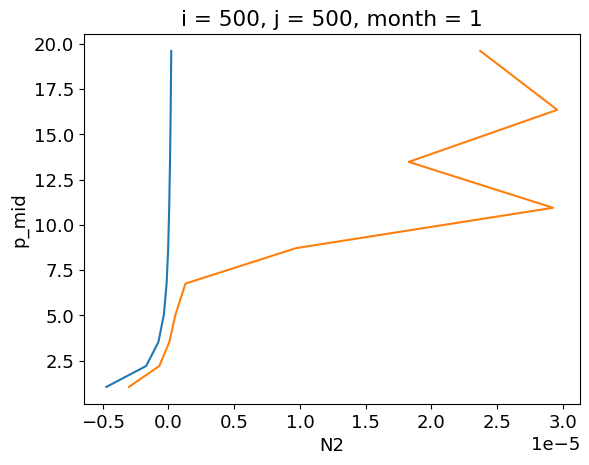

In [93]:
N2_da_20m_month_mean.isel(month=0,j=800,i=100).plot(y='p_mid');
N2_da_20m_month_mean.isel(month=0,j=500,i=500).plot(y='p_mid');

In [94]:
# take integral of N over upper 20 m
# taking the absolute value to handle negative values that are very close to zero
N_int20_month_mean = np.sqrt(abs(N2_da_20m_month_mean.integrate('p_mid')))

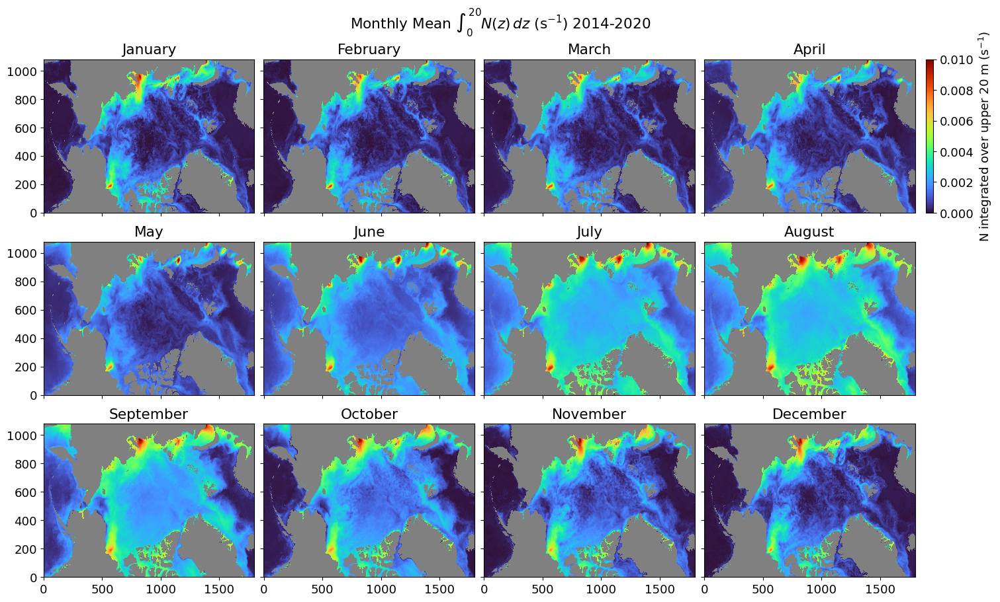

In [103]:
# get global vmin and vmax for consistent color mapping
vmin = 0
vmax = 0.01

# set up the figure and subplots
fig, axes = plt.subplots(3, 4, figsize=(15, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# plot each month's mean as a subplot
for month in range(1, 13):
    ax = axes[month - 1]
    im = N_int20_month_mean.sel(month=month).plot(
        ax=ax, 
        cmap='turbo', 
        # vmin=vmin, 
        # vmax=vmax, 
        add_colorbar=False
    )
    ax.set_title(calendar.month_name[month])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_facecolor('gray')

# add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes[3],  # the 4th subplot
    location='right'
)
cbar.ax.set_ylabel('N integrated over upper 20 m (s$^{-1}$)')

# add a title
plt.suptitle(r'Monthly Mean $\int_0^{20} N(z) \, dz$ (s$^{-1}$) 2014-2020')
plt.show()

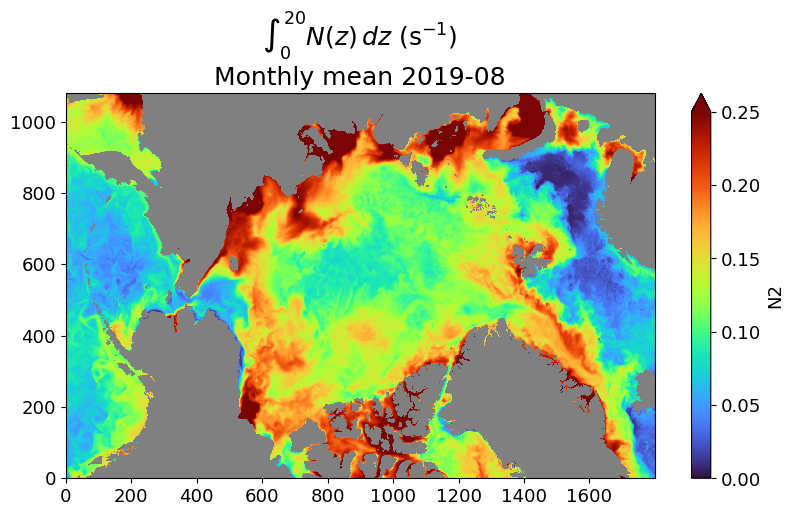

In [49]:
plt.rcParams.update({'font.size': 13})
fig, ax = plt.subplots(figsize=[9.5,5])
N_int20.sel(time="2019-08-15").plot(ax=ax,cmap='turbo', vmin=0, vmax=0.25);
ax.set_facecolor('gray')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title(r'$\int_0^{20} N(z) \, dz$ (s$^{-1}$)' + '\nMonthly mean 2019-08',size=18);

In [50]:
# compute correlations

# start time
start_time = time.time()

corr_intN20 = xr.corr(salt_month.isel(k=0), N_int20, dim='time').compute()
corr_intN100 = xr.corr(salt_month.isel(k=0), N_int100, dim='time').compute()

# end time
end_time = time.time()

# calculate elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.6f} seconds")

Execution time: 299.296179 seconds


In [146]:
corr_significant_20m = sig_corr(corr_intN20, len(salt_month['time']))

In [148]:
corr_significant_100m = sig_corr(corr_intN100, len(salt_month['time']))

In [129]:
# used this for comparison of calculation to make sure it was right
# import scipy.stats
# x = N_int20.isel(j=800,i=800)
# y = salt_month.isel(k=0,j=800,i=800)
# corr, p = scipy.stats.pearsonr(x, y)

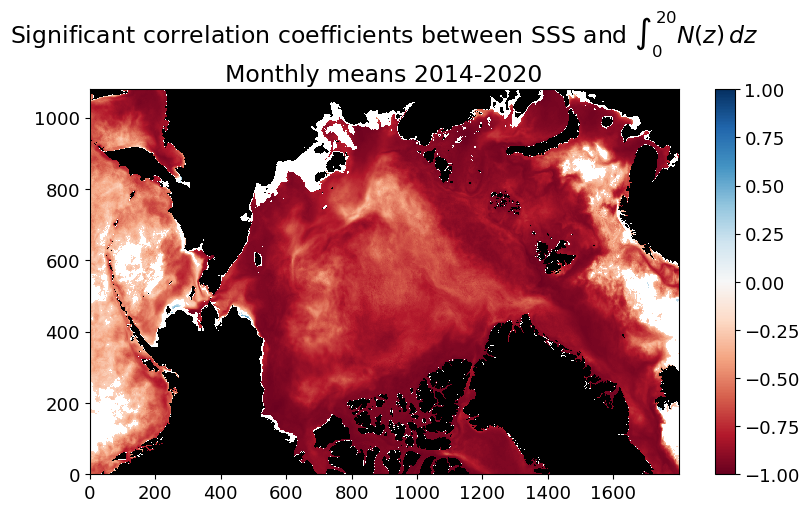

In [147]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
corr_significant_20m.plot(ax=ax,cmap='RdBu',vmin=-1,vmax=1);
HH_grid_land.plot(vmin=0,vmax=1,cmap='Greys_r',add_colorbar=False);
# ax.set_facecolor('gray')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title('Significant correlation coefficients between SSS and $\int_0^{20} N(z) \, dz$\nMonthly means 2014-2020', size=17);

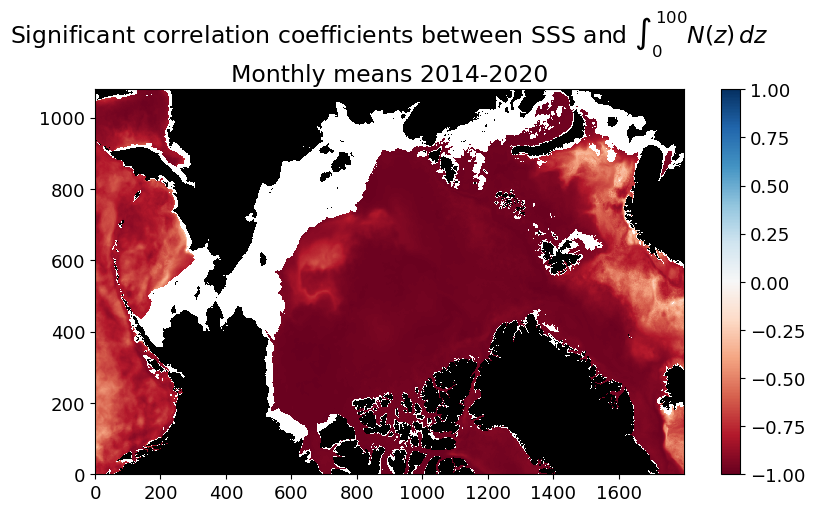

In [149]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
corr_significant_100m.plot(ax=ax,cmap='RdBu',vmin=-1,vmax=1);
# ax.set_facecolor('gray')
HH_grid_land.plot(vmin=0,vmax=1,cmap='Greys_r',add_colorbar=False);
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title('Significant correlation coefficients between SSS and $\int_0^{100} N(z) \, dz$\nMonthly means 2014-2020', size=17);

### Plot some example profiles

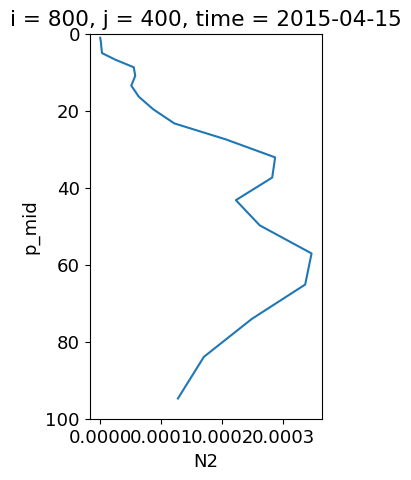

In [54]:
N2_zarr.N2.isel(time=15,i=800,j=400).plot(y='p_mid',figsize=[3,5]);
plt.ylim(100,0);

In [56]:
#integral
integral = N2_zarr.N2.isel(time=15,i=800,j=400).integrate('p_mid').values
print(f'integral 100 m: {integral}')

delta_rho = (N2_zarr.N2.isel(time=15,i=800,j=400,p_mid=20) - N2_zarr.N2.isel(time=15,i=800,j=400,p_mid=0)).values
print(f'delta rho 100 m: {delta_rho}')

integral 100 m: 0.018784260542561493
delta rho 100 m: 0.0001275480876444206


## Plot correlation between delta rho and integral

I want to check to see these two quantities are highly correlated since we are using delta rho as a metric for stratification.

In [57]:
# compute correlations

# start time
start_time = time.time()

corr_intN20_deltarho = xr.corr(delta_sigma_20m, N_int20, dim='time').compute()
corr_intN100_deltarho = xr.corr(delta_sigma_100m, N_int100, dim='time').compute()

# end time
end_time = time.time()

# calculate elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.6f} seconds")

Execution time: 385.269233 seconds


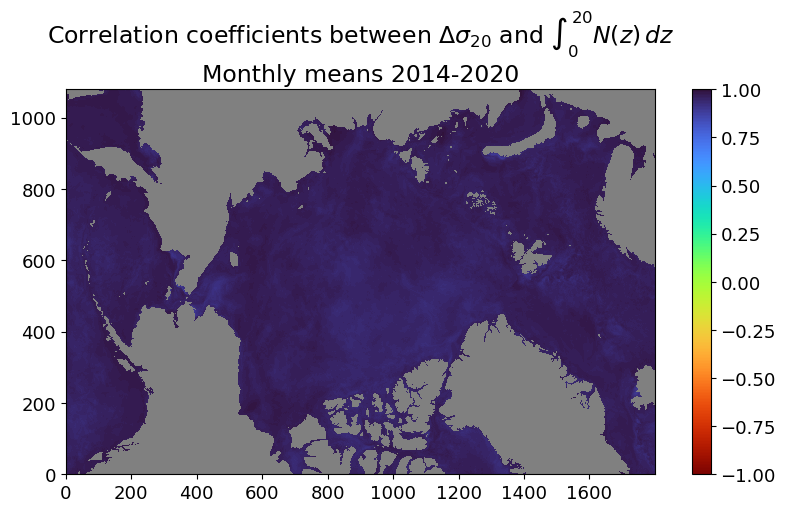

In [58]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
corr_intN20_deltarho.plot(ax=ax,cmap='turbo_r',vmin=-1,vmax=1);
ax.set_facecolor('gray')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title('Correlation coefficients between $\Delta \sigma_{20}$ and $\int_0^{20} N(z) \, dz$\nMonthly means 2014-2020', size=17);

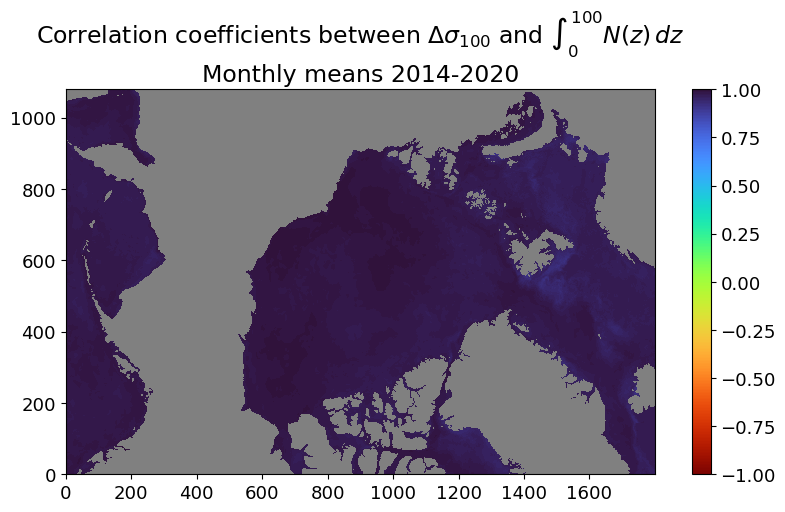

In [59]:
# same plot as above - just plotting to sanity check that absolute salinity is same as practial salinity above
fig, ax = plt.subplots(figsize=[9.5,5])
corr_intN100_deltarho.plot(ax=ax,cmap='turbo_r',vmin=-1,vmax=1);
ax.set_facecolor('gray')
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title('Correlation coefficients between $\Delta \sigma_{100}$ and $\int_0^{100} N(z) \, dz$\nMonthly means 2014-2020', size=17);

The difference in density between the surface and 20 m (or 100 m) is highly correlated with the integral of N in the upper 20 m (or 100m) as we expected to see

## Scatter plots

In [36]:
# initialize dictionaries to store results for each month
sigma_dict = {}
salt_dict = {}
theta_dict = {}
lat_dict = {}

lat_flat = (HH_grid.YC.expand_dims(time=7).values).flatten() # latitudes

# iterate over all months
for month in range(1, 13):
    # select data for the current month
    sigma_flat = delta_sigma_20m.sel(time=delta_sigma_20m['time.month'] == month).values.flatten()
    salt_flat = salt_month.isel(k=0).sel(time=salt_month['time.month'] == month).values.flatten()
    theta_flat = theta_month.isel(k=0).sel(time=theta_month['time.month'] == month).values.flatten()
    
    # create a mask based on NaNs in delta_sigma_20m
    nan_mask = ~np.isnan(sigma_flat)
    
    # Store masked and flattened data
    sigma_dict[month] = sigma_flat[nan_mask]
    salt_dict[month] = salt_flat[nan_mask]
    theta_dict[month] = theta_flat[nan_mask]
    lat_dict[month] = lat_flat[nan_mask]

# access data for any specific month, e.g., June (6):
sigma_Jun = sigma_dict[6]
salt_Jun = salt_dict[6]
theta_Jun = theta_dict[6]

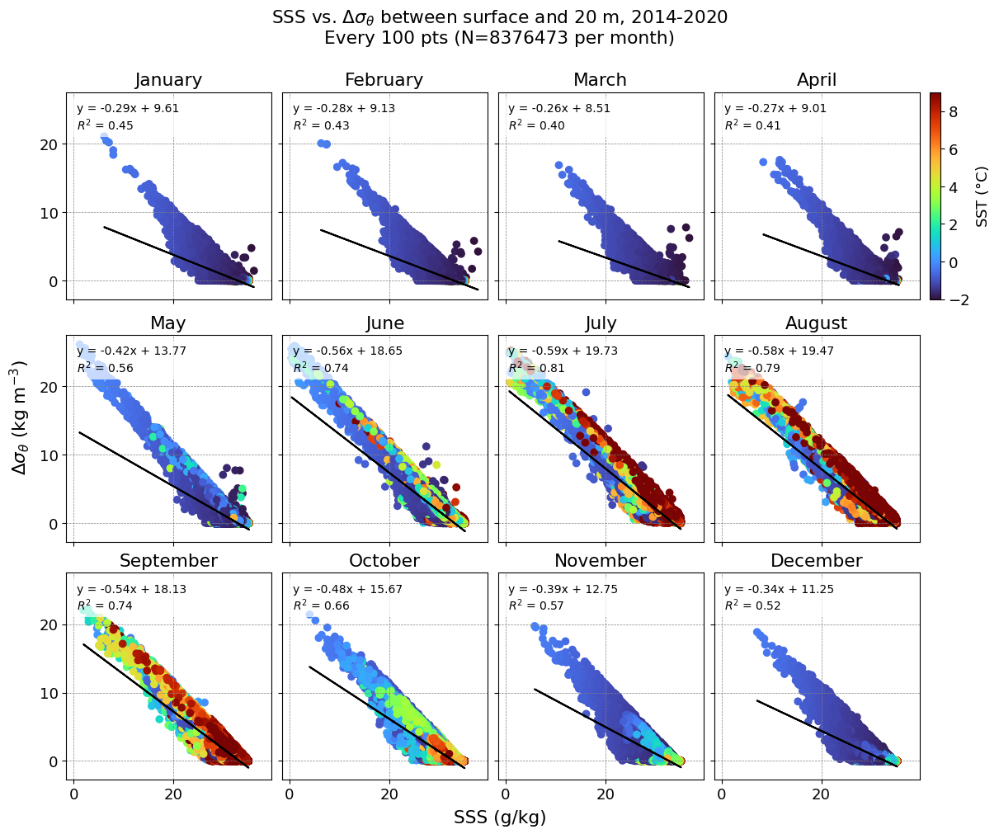

Time taken to plot: 0.3364 minutes


In [61]:
# measure time to generate plot
start_time = time.time()

plt.rcParams.update({'font.size': 13})

# create subplots
fig, axes = plt.subplots(3, 4, figsize=[12, 10], sharey=True, sharex=True, layout='constrained')

# flatten the axes array for easier indexing
axes = axes.flatten()

# loop through each month and corresponding subplot
for month in range(1, 13):
    ax = axes[month - 1]  # access subplot for the current month
    x = salt_dict[month][::100]  # sample every 100th point
    y = sigma_dict[month][::100]
    
    # Scatter plot
    scatter = ax.scatter(
        x, y,
        c=theta_dict[month][::100],
        cmap='turbo', vmin=-2, vmax=9
    )
    ax.grid(linestyle='dashed', color='gray', linewidth=0.5)
    
    # fit line of best fit
    slope, intercept = np.polyfit(x, y, 1)
    y_fit = np.polyval([slope, intercept], x)
    
    # plot the best fit line
    ax.plot(x, y_fit, color='black', linewidth=1.5)
    
    # calculate R^2
    residuals = y - y_fit
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1 - (ss_res / ss_tot)
    
    # add the equation and R^2 to the plot
    ax.text(0.05, 0.95, f"y = {slope:.2f}x + {intercept:.2f}\n$R^2$ = {r2:.2f}",
            transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    # title for each subplot
    ax.set_title(calendar.month_name[month])

# add shared labels
fig.supxlabel("SSS (g/kg)")
fig.supylabel(r'$\Delta \sigma_{\theta}$ (kg m$^{-3}$)')

# add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=-2, vmax=9)),
    ax=axes[3],  # the 4th subplot
    location='right'
)
cbar.ax.set_ylabel('SST ($\degree$C)')

# add a title
plt.suptitle(r'SSS vs. $\Delta \sigma_{\theta}$ between surface and 20 m, 2014-2020'+ f'\nEvery 100 pts (N={len(sigma_dict[2])} per month)\n')

plt.show()

end_time = time.time()

# calculate elapsed time
elapsed_time = (end_time - start_time) / 60
print(f"Time taken to plot: {elapsed_time:.4f} minutes")

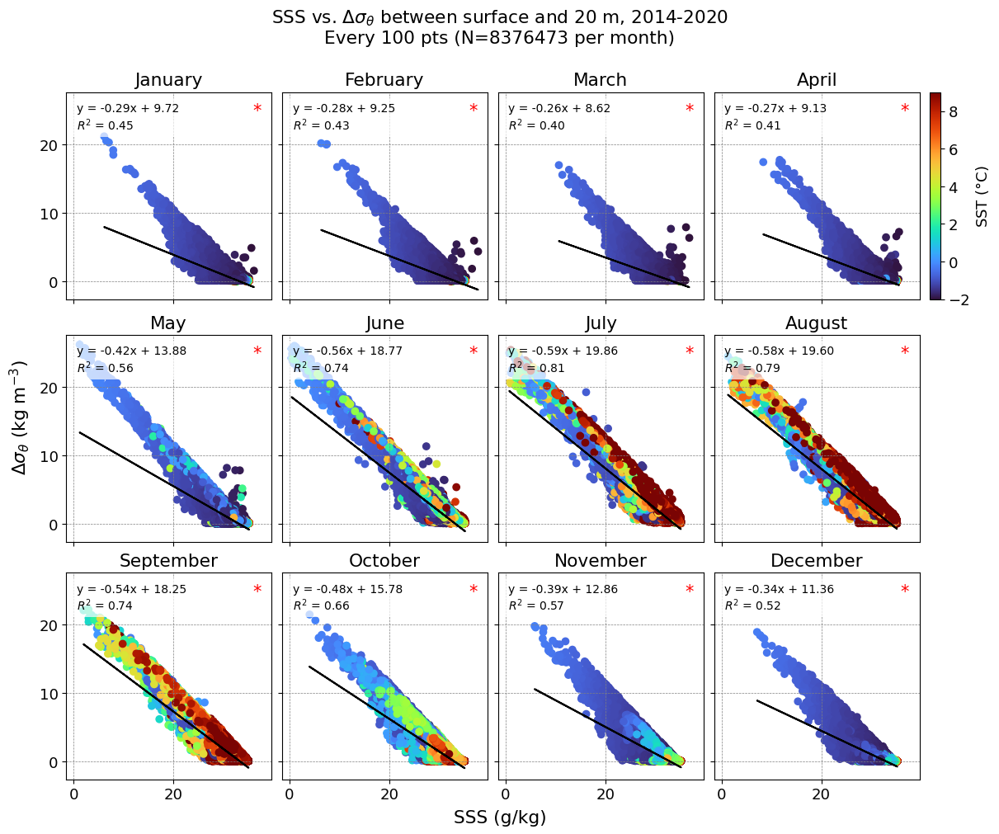

Time taken to plot: 0.3347 minutes


In [37]:
from scipy.stats import linregress
import time
import numpy as np
import matplotlib.pyplot as plt
import calendar

# Measure time to generate plot
start_time = time.time()

plt.rcParams.update({'font.size': 13})

# Create subplots
fig, axes = plt.subplots(3, 4, figsize=[12, 10], sharey=True, sharex=True, layout='constrained')

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through each month and corresponding subplot
for month in range(1, 13):
    ax = axes[month - 1]  # Access subplot for the current month
    x = salt_dict[month][::100]  # Sample every 100th point
    y = sigma_dict[month][::100]
    
    # Scatter plot
    scatter = ax.scatter(
        x, y,
        c=theta_dict[month][::100],
        cmap='turbo', vmin=-2, vmax=9
    )
    ax.grid(linestyle='dashed', color='gray', linewidth=0.5)
    
    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    y_fit = slope * x + intercept
    
    # Plot the best fit line
    ax.plot(x, y_fit, color='black', linewidth=1.5)
    
    # Add the equation and R^2 to the plot
    r2 = r_value**2
    ax.text(0.05, 0.95, f"y = {slope:.2f}x + {intercept:.2f}\n$R^2$ = {r2:.2f}",
            transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    # Add significance star if p-value < 0.05
    if p_value < 0.05:
        ax.text(0.95, 0.95, "*", transform=ax.transAxes, fontsize=15, color='red', 
                verticalalignment='top', horizontalalignment='right')
    
    # Title for each subplot
    ax.set_title(calendar.month_name[month])

# Add shared labels
fig.supxlabel("SSS (g/kg)")
fig.supylabel(r'$\Delta \sigma_{\theta}$ (kg m$^{-3}$)')

# Add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=-2, vmax=9)),
    ax=axes[3],  # The 4th subplot
    location='right'
)
cbar.ax.set_ylabel('SST ($\degree$C)')

# Add a title
plt.suptitle(r'SSS vs. $\Delta \sigma_{\theta}$ between surface and 20 m, 2014-2020' + 
             f'\nEvery 100 pts (N={len(sigma_dict[2])} per month)\n')

plt.show()

end_time = time.time()

# Calculate elapsed time
elapsed_time = (end_time - start_time) / 60
print(f"Time taken to plot: {elapsed_time:.4f} minutes")

#### Plot counts per cell to see density of points

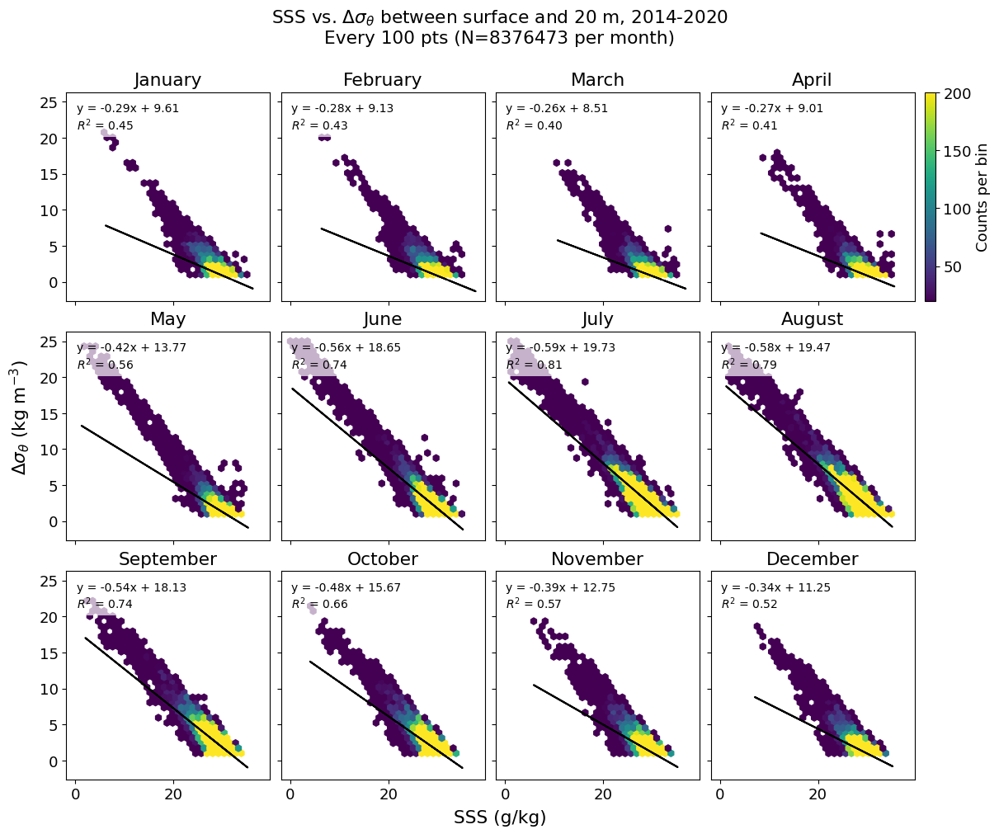

Time taken to plot: 0.0342 minutes


In [62]:
# measure time to generate plot
start_time = time.time()

plt.rcParams.update({'font.size': 13})

# create subplots
fig, axes = plt.subplots(3, 4, figsize=[12, 10], sharey=True, sharex=True, layout='constrained')

# flatten the axes array for easier indexing
axes = axes.flatten()

# define the extent for the hexbin plots
extent = [0, 35, 1, 25]

# loop through each month and corresponding subplot
for month in range(1, 13):
    ax = axes[month - 1]  # access subplot for the current month
    x = salt_dict[month][::100]  # sample every 100th point
    y = sigma_dict[month][::100]
    
    # hexbin plot
    hexbin = ax.hexbin(x, y, gridsize=30, cmap='viridis', mincnt=1, extent=extent, vmin=20, vmax=200)
    
    # fit line of best fit
    slope, intercept = np.polyfit(x, y, 1)
    y_fit = np.polyval([slope, intercept], x)
    
    # plot the best fit line
    ax.plot(x, y_fit, color='black', linewidth=1.5)
    
    # calculate R^2
    residuals = y - y_fit
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1 - (ss_res / ss_tot)
    
    # add the equation and R^2 to the plot
    ax.text(0.05, 0.95, f"y = {slope:.2f}x + {intercept:.2f}\n$R^2$ = {r2:.2f}",
            transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    # title for each subplot
    ax.set_title(calendar.month_name[month])

# add shared labels
fig.supxlabel("SSS (g/kg)")
fig.supylabel(r'$\Delta \sigma_{\theta}$ (kg m$^{-3}$)')

# add a colorbar for the hexbin plot
cbar = fig.colorbar(hexbin, ax=axes[3], location='right')
cbar.ax.set_ylabel('Counts per bin')

# add a title
plt.suptitle(r'SSS vs. $\Delta \sigma_{\theta}$ between surface and 20 m, 2014-2020'+ f'\nEvery 100 pts (N={len(sigma_dict[2])} per month)\n')

plt.show()

end_time = time.time()

# calculate elapsed time
elapsed_time = (end_time - start_time) / 60
print(f"Time taken to plot: {elapsed_time:.4f} minutes")

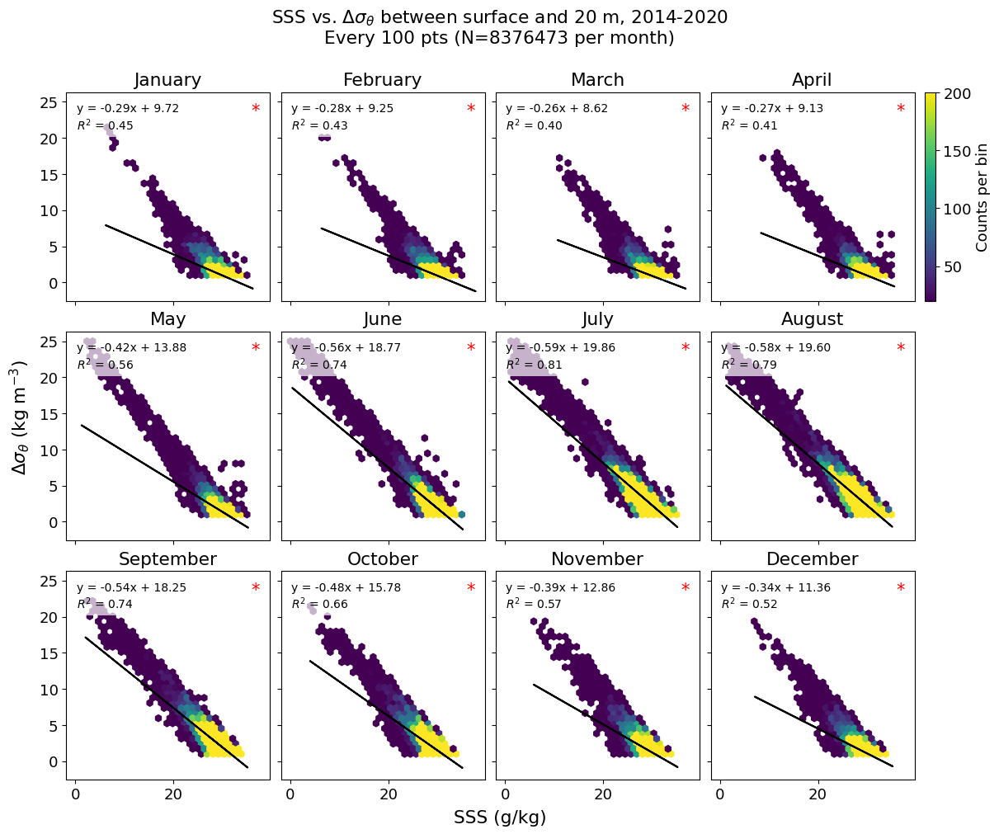

Time taken to plot: 0.0365 minutes


In [38]:
# Measure time to generate plot
start_time = time.time()

plt.rcParams.update({'font.size': 13})

# Create subplots
fig, axes = plt.subplots(3, 4, figsize=[12, 10], sharey=True, sharex=True, layout='constrained')

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Define the extent for the hexbin plots
extent = [0, 35, 1, 25]

# Loop through each month and corresponding subplot
for month in range(1, 13):
    ax = axes[month - 1]  # Access subplot for the current month
    x = salt_dict[month][::100]  # Sample every 100th point
    y = sigma_dict[month][::100]
    
    # Hexbin plot
    hexbin = ax.hexbin(x, y, gridsize=30, cmap='viridis', mincnt=1, extent=extent, vmin=20, vmax=200)
    
    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    y_fit = slope * x + intercept
    
    # Plot the best fit line
    ax.plot(x, y_fit, color='black', linewidth=1.5)
    
    # Add the equation and R^2 to the plot
    r2 = r_value**2
    ax.text(0.05, 0.95, f"y = {slope:.2f}x + {intercept:.2f}\n$R^2$ = {r2:.2f}",
            transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    # Add significance star if p-value < 0.05
    if p_value < 0.05:
        ax.text(0.95, 0.95, "*", transform=ax.transAxes, fontsize=15, color='red', 
                verticalalignment='top', horizontalalignment='right')
    
    # Title for each subplot
    ax.set_title(calendar.month_name[month])

# Add shared labels
fig.supxlabel("SSS (g/kg)")
fig.supylabel(r'$\Delta \sigma_{\theta}$ (kg m$^{-3}$)')

# Add a colorbar for the hexbin plot
cbar = fig.colorbar(hexbin, ax=axes[3], location='right')
cbar.ax.set_ylabel('Counts per bin')

# Add a title
plt.suptitle(r'SSS vs. $\Delta \sigma_{\theta}$ between surface and 20 m, 2014-2020' + 
             f'\nEvery 100 pts (N={len(sigma_dict[2])} per month)\n')

plt.show()

end_time = time.time()

# Calculate elapsed time
elapsed_time = (end_time - start_time) / 60
print(f"Time taken to plot: {elapsed_time:.4f} minutes")

#### Color by latitude

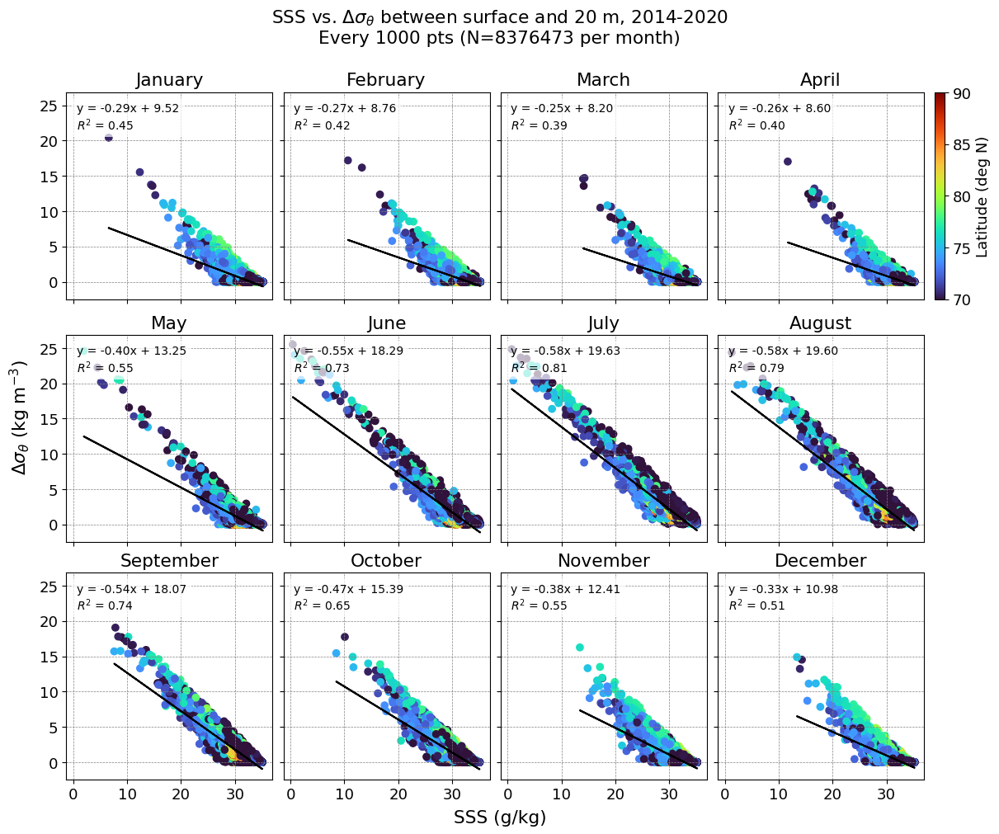

Time taken to plot: 0.0608 minutes


In [63]:
# measure the time taken to plot
start_time = time.time()

plt.rcParams.update({'font.size': 13})

# create subplots
fig, axes = plt.subplots(3, 4, figsize=[12, 10], sharey=True, sharex=True, layout='constrained')

# flatten the axes array for easier indexing
axes = axes.flatten()

# loop through each month and corresponding subplot
for month in range(1, 13):
    ax = axes[month - 1]  # access subplot for the current month
    x = salt_dict[month][::1000]  # sample every 1000th point
    y = sigma_dict[month][::1000]
    
    # scatter plot
    scatter = ax.scatter(
        x, y,
        c=lat_dict[month][::1000],
        cmap='turbo', vmin=70, vmax=90
    )
    ax.grid(linestyle='dashed', color='gray', linewidth=0.5)
    
    # fit line of best fit
    slope, intercept = np.polyfit(x, y, 1)
    y_fit = np.polyval([slope, intercept], x)
    
    # plot the best fit line
    ax.plot(x, y_fit, color='black', linewidth=1.5)
    
    # calculate R^2
    residuals = y - y_fit
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1 - (ss_res / ss_tot)
    
    # add the equation and R^2 to the plot
    ax.text(0.05, 0.95, f"y = {slope:.2f}x + {intercept:.2f}\n$R^2$ = {r2:.2f}",
            transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    # title for each subplot
    ax.set_title(calendar.month_name[month])

# add shared labels
fig.supxlabel("SSS (g/kg)")
fig.supylabel(r'$\Delta \sigma_{\theta}$ (kg m$^{-3}$)')

# add a colorbar for the 4th subplot only
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap='turbo', norm=plt.Normalize(vmin=70, vmax=90)),
    ax=axes[3],
    location='right'
)
cbar.ax.set_ylabel('Latitude (deg N)')

# add a super title
plt.suptitle(r'SSS vs. $\Delta \sigma_{\theta}$ between surface and 20 m, 2014-2020'+ f'\nEvery 1000 pts (N={len(sigma_dict[2])} per month)\n')

plt.show()

end_time = time.time()

# calculate elapsed time
elapsed_time = (end_time - start_time) / 60
print(f"Time taken to plot: {elapsed_time:.4f} minutes")